## I - Objet : Voice Activity Detector - Temporel

## II - Pré-requis :

- Charger le df_multi_11025hz.npy


## III -  Code :

### III.i - Bibliothèques requises

In [1]:
import os
import re
import subprocess
import pandas as pd
import numpy as np
import glob
import pathlib
import librosa
import matplotlib.pyplot as plt
import torchaudio
import torch
from sklearn.metrics import classification_report
from IPython.display import Audio
import swifter
import warnings
warnings.filterwarnings("ignore")

### III.ii - Fonctions dédiées

In [2]:
#######################################################################################################
# la fonction qui crée des échantillons disjoints de nb_var features pour une dataframe donnée.


def create_data_fast(signal,nb_var):
    
    ECH_mix = [[] for _ in range(nb_var)]                    # la liste amenée à contenir l'ensemble des tables d'échantillons musicaux disjoints

    for k in range(nb_var):                                  # On crée chaque table d'échantillons disjoints (les datas) et on les ajoute à la liste ECH_mix (la liste d'échantillons décalé de 1 pas temporel)
        data=[]                                              # la table d'échantillons contenant un nombre nb_var de pas temporels.
        for i in range(k,len(signal)-nb_var,nb_var):         # pour que chaque échantillon ait le même nombre de valeurs et que chaque table ait le même nombre d'échantillons, il faut tronquer le signal
            data.append(signal[i:i+nb_var])              
        ECH_mix[k].append(data)                              # l'ensemble des tables d'échantillons, décalées de l'incrément k, auant que de nb_var, sont ajoutées à la liste.
        if len (ECH_mix[k][0])>nb_var:
            ECH_mix[k][0]=ECH_mix[k][0][:-1] 
            
    return pd.DataFrame(ECH_mix[0][0])
    


#######################################################################################################    
# Une fonction qui permet d'ajouter une variable qui va encoder, pour chaque ligne, le nombre de changements de signe.

def count(liste):
    count = 0
    for i in range(0,len(liste)-1):
        
        if liste[i] > 0 and liste[i+1]>0:
            count = count
        if liste[i] < 0 and liste[i+1]<0:
            count = count
        if liste[i] < 0 and liste[i+1]>0:
            count +=1
        if liste[i] > 0 and liste[i+1]<0:
            count+=1
    return count


#######################################################################################################
# une fonction qui permet d'ajouter une variable qui va encoder, pour chaque ligne, le nombre d'oscillations.

def oscille(liste):
    count = 0
    for i in range(0,len(liste)-2):
        if liste[i] < liste[i+1] and liste[i+1] < liste[i+2]:
            count = count
        if liste[i] > liste[i+1] and liste[i+1] > liste[i+2]:
            count = count
            
            
        if liste[i] < liste[i+1] and liste[i+1] > liste[i+2]:
            count +=1
        if liste[i] > liste[i+1] and liste[i+1] < liste[i+2]:
            count +=1
      
    return count

#######################################################################################################
def periode(liste):   
        
        x = [i for i in range(len(liste))]
        y = liste
        
        x = np.asarray(x)
        y = np.asarray(y)
        
        p4 = np.poly1d(np.polyfit(x,y,20)) # On applique une regression polynomiale sur le nuage de point.
        
        valeur = list(p4(x))
        
        position_max_min = []
        
        for i in range(len(valeur)-1): # On récupère la position des maximums de courbes.
            if valeur[i-1]< valeur[i] and valeur[i]> valeur[i+1]:
                position_max_min.append(i)
        
        periode = 0
        
        if len(position_max_min)>=2:
            periode = position_max_min[1]-position_max_min[0]
        
        return len(position_max_min)     

    ##########################################################################################################
# la fonction qui produit le ratio audible / durée morceaux:

def ratio(signal_vocal):
    
    duree_total = len(signal_vocal)                                    # le nombre de valeurs d'amplitude du morceau.
    seuil_vocal = np.where(abs(signal_vocal)> seuil,1,0)               # Si la valeur d'amplitude est au-dessus du seuil -> 1 sinon 0
    df_echantillon_seuil = create_data_fast(seuil_vocal,nb_var)        # Utilisation format Dataframe pour les seuils 
    
    # On somme toutes les valeurs de seuil
    df_echantillon_seuil['somme'] =  df_echantillon_seuil.sum(axis = 1)
    
    # Si la somme est nulle (i.e si aucune valeur n'est au dessus du seuil, alors on est en présence d'inaudible)
    # A l'inverse, si au moins une valeur est au dessus, alors on consdière que le tronçon entier est constitutif d'un
    # passage audible
    
    df_echantillon_seuil['label'] = df_echantillon_seuil['somme'].apply(lambda x : 0 if x ==0 else 1)
    
    silence = df_echantillon_seuil['label'][df_echantillon_seuil['label']==0]
    audible = df_echantillon_seuil['label'][df_echantillon_seuil['label']==1]
    return  len(audible)/ (len(audible)+len(silence))

### III.iii - Constantes à fixer à priori

In [3]:
nb_var = 100      # Le nombre de pas de temps constitutifs des échantillons.
seuil = 0.01      # le seuil permettant de séparer la voix de la non-voix pour un ensemble de nb_var consécutif 
nb_morceau = 5    # le nombre de morceaux exploités dans ce notebook.

### III.iv - Développement

- On charge le dataframe contenant les signaux.

In [4]:
check = np.load('df_multi_11025hz.npy', allow_pickle=True )
df = pd.DataFrame(check,columns = ['Id', 'Artiste_Morceau', 'Style', 'bass', 'drums', 'mixture', 'other',
       'vocals'])

In [5]:
# On utilise ici la dataframe contenant les signaux de 30s rééchantillonnés à 11025 hz.
df

,Id,Artiste_Morceau,Style,bass,drums,mixture,other,vocals
0,051,AM Contra - Heart Peripheral,Electronic Dance Pop,"[2.632297087396038e-07, -2.04318517756087e-06,...","[-0.015721061683009636, -0.031304806665571346,...","[0.05859775642748738, 0.08789382560566596, 0.0...","[0.030141985383485958, 0.035894161111689735, 0...","[0.044176569497302226, 0.08330651434472504, 0...."
1,052,ANiMAL - Easy Tiger,UK Hip-Hop,"[0.03029084172839695, 0.04986721235264597, 0.0...","[0.00023837223081789972, -0.00784230951979111,...","[0.05852362144981223, 0.06324586073083593, 0.0...","[0.021160720365070454, 0.00611920933845775, 0....","[0.006795724143759986, 0.015058461047049863, 0..."
2,053,Actions - Devil s Words,Power Pop,"[-0.0555839928275754, -0.10241703006492457, -0...","[0.003928351842600991, 0.0038761954863446376, ...","[0.04412867421131752, 0.11408366939102713, 0.1...","[0.02109426005046844, 0.011327480491688354, 0....","[0.07469005514582357, 0.20129702347791872, 0.1..."
3,054,Actions - South Of The Water,Power Pop,"[-0.022787741845658693, -0.04433033710494286, ...","[-0.01444216464097936, 0.019299435356199688, -...","[-0.021761776330176858, 0.0014023563155406622,...","[0.013841552709523062, 0.03851927886586004, 0....","[0.0016259974158009645, -0.012087366837672685,..."
4,055,Angels In Amplifiers - I m Alright,Smooth Acoustic Rock,"[-0.02052492630290659, -0.034206967551617215, ...","[-0.008308486329972331, -0.016655484512553127,...","[-0.15183824308470822, -0.2843798766735203, -0...","[0.028447334293476137, 0.030272573152990954, -...","[-0.15145216474530546, -0.26378999776234163, -..."
...,...,...,...,...,...,...,...,...
95,046,Triviul - Dorothy,Leftfield Pop/Electronica,"[-0.0019813982727089176, -0.003400766822534873...","[2.6778792126283146e-05, 4.00860080821761e-05,...","[-0.03341956749964344, -0.05531216723969173, -...","[-0.02962705983407994, -0.049478315272743954, ...","[-0.0018449912209839694, -0.002473441711240461..."
96,047,Voelund - Comfort Lives In Belief,Laid-back Blues-Rock,"[-0.001735082139630293, -0.005497134706965482,...","[-0.0005825115070097776, 0.004423918766349187,...","[-0.024607226279084772, -0.031434732646672126,...","[-0.01453506173995748, -0.02024629596311567, -...","[-0.007739412996469064, -0.010098884190040094,..."
97,048,We Fell From The Sky - Not You,High-Energy Heavy Rock,"[0.004479666778246153, 0.0069667620222247095, ...","[-0.14606607364105595, -0.26986159774469687, -...","[-0.15107696095589623, -0.3595638094184755, -0...","[0.0011269370155494573, -0.015592363883931936,...","[-0.0106181227875052, -0.08107747067855918, -0..."
98,049,Young Griffo - Facade,Anthemic Heavy Rock,"[-0.04890075829003364, -0.08041625086733774, -...","[-0.0042556223818492256, -0.002114667246221792...","[-0.08896964349202693, -0.1624551222875395, -0...","[0.03845995127121133, 0.06352584826120554, 0.0...","[-0.07426435926691605, -0.14343865302771253, -..."


 - On recupère les signaux  de support à l'entrainement et on produits les arrays associés:
     - Il nous faut récupérer des signaux présentant une proportion adéquate de silence, i.e ceux qui permettent d'équilibrer les classes.
     - On utilise la méthode appliquée à la dataviz pour choisir les morceaux.

Pandas Apply:   0%|          | 0/100 [00:00<?, ?it/s]

Text(0.5, 1.0, 'ordonnancement des morceaux par ratio')

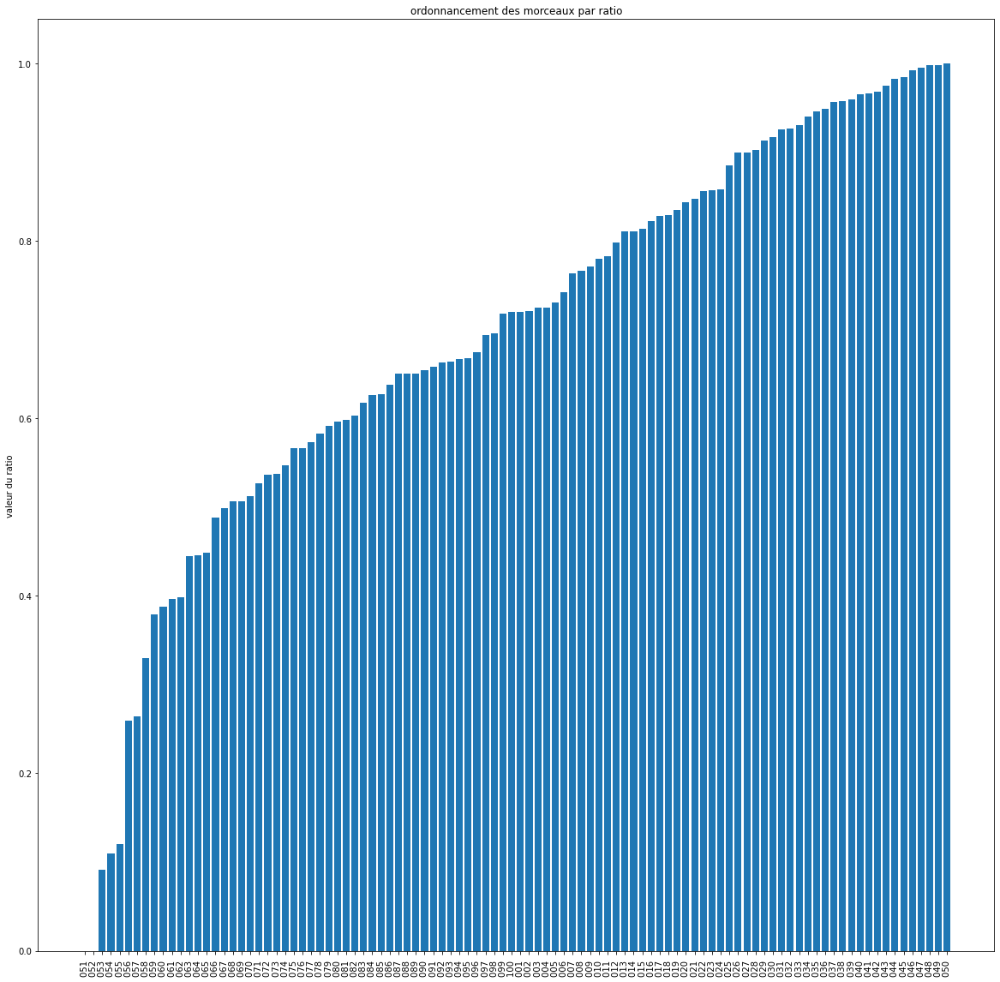

In [6]:
# On produit la colonne ratio.
df['ratio'] = df['vocals'].swifter.apply(lambda x: ratio(x))

# On produit le graphique qui rend compte de la répartition des ratios en fonction des morceaux.
plt.figure(figsize=(20,20))
plt.bar(df.Id,df.ratio.sort_values())
plt.xticks(rotation='vertical')
plt.ylabel('valeur du ratio')
plt.title('ordonnancement des morceaux par ratio')

In [7]:
Audio(df.iloc[66,5],rate = 11025)

In [8]:
# On produit la liste.

sel = [47,1,44,43,63,48,64,65]

# nb_var morceaux de 30s en canal mix. 
signal_mix = df.loc[0,'mixture']
for i in sel:
    signal_mix = np.concatenate([signal_mix,df.loc[i,'mixture']])

# nb_var morceaux de 30s en canal vocal, correspondant aux précédants.
signal_vocal = df.loc[0,'vocals']
for i in sel:
    signal_vocal = np.concatenate([signal_vocal,df.loc[i,'vocals']])



- On crée, pour signal, l'array mirroir contenant des 1 et des 0 selon que la valeur considérée est resp. supérieure ou inférieure au seuil établi à la dataviz

In [9]:
seuil_vocal = np.where(abs(signal_vocal)> seuil,1,0)

- On produit des échantillons contenant nb_var temporels, mise en forme dans des dataframes:
    - le df_echantillon_mixture contient les amplitudes issues de signal_mix.
    - le df_echantillon_vocal contient les amplitudes issues de signal_vocal.
    - le df_echantillon_seuil contient les valeurs 1 et 0; il est corrélé au df_echantillon_vocal

In [10]:
df_echantillon_mixture = create_data_fast(signal_mix,nb_var)
df_echantillon_vocal = create_data_fast(signal_vocal,nb_var)
df_echantillon_seuil = create_data_fast(seuil_vocal,nb_var)

- On considère que pour un échantillon donné, si toutes les valeurs sont inférieures au seuil, alors on peut penser qu'il n'y a pas de voix. A l'inverse, si au moins une valeur est supérieure au seuil, alors on considère qu'il s'agit d'un échantillon à voix. 
- Pour mettre en forme cette pensée, on somme toutes les colonnes pour chaque lignes de df_echantillon_seuil. Si la somme est égale à 0, alors on est présence de non voix et on labelise à 0. Dans tous les autres cas, on labelise à 1.

In [11]:
df_echantillon_seuil['somme'] =  df_echantillon_seuil.sum(axis = 1)
df_echantillon_seuil['label'] = df_echantillon_seuil['somme'].apply(lambda x : 0 if x ==0 else 1)

In [12]:
df_echantillon_seuil

,0,1,2,3,4,5,6,7,8,9,...,92,93,94,95,96,97,98,99,somme,label
0,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,0,1,1,1,94,1
1,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,95,1
2,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,0,93,1
3,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,97,1
4,0,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,94,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29761,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29762,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29763,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29764,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


- On applique ces label au df_echantillon_mixture.

In [13]:
df_echantillon_mixture['label'] = df_echantillon_seuil['label']

- On s'intéresse à la proportion des classes.

In [14]:
pd.DataFrame({'Count':df_echantillon_mixture['label'].value_counts(),'%':round(100*(df_echantillon_mixture['label'].value_counts()/len(df_echantillon_mixture['label'])))})

,Count,%
1,17856,60.0
0,11910,40.0


- On vérifie à l'écoute

In [15]:
essai_voix = df_echantillon_mixture[df_echantillon_mixture['label']==1].drop(['label'],axis = 1)
essai_mute = df_echantillon_mixture[df_echantillon_mixture['label']==0].drop(['label'],axis = 1)

In [16]:
# Pour la musique chantée.
essai_voix['liste']= essai_voix[essai_voix.columns].apply(lambda x : list(x.dropna()),axis = 1)
ecoute = np.array([element for liste in essai_voix['liste'].values for element in liste])
    
Audio(ecoute,rate = 11025)

In [17]:
# Pour la musique sans chant.

essai_mute['liste']= essai_mute[essai_mute.columns].apply(lambda x : list(x.dropna()),axis = 1)
silence = np.array([element for liste in essai_mute['liste'].values for element in liste])
    
Audio(silence,rate = 11025)

- Résultats: 
    - aucune voix n'est audible à la lecture de "silence". 
    - Pas ou peu de silence à la lecture de "ecoute"
- Les classes sont équilibrées.
- -----> La stratégie de classification semble correcte

- On rajoute des variables discriminantes tel que:
    - le nombre de franchissement de l'axe des abscisses.
    - le nombre d'oscillations.
    - la période moyenne de chaque échantillon.

In [18]:
DATA_MIX = df_echantillon_mixture.copy()
DATA_MIX['liste'] = DATA_MIX[DATA_MIX.columns[0:nb_var+1]].apply(lambda x: list(x.dropna()),axis = 1)
DATA_MIX['count'] = DATA_MIX['liste'].apply(lambda x : count(x))
DATA_MIX['oscille'] = DATA_MIX['liste'].apply(lambda x : oscille(x))
DATA_MIX['periode'] = DATA_MIX['liste'].apply(lambda x : periode(x))

- On prépare les données pour l'entrainement

In [19]:
features = DATA_MIX.drop(['label','liste'],axis = 1)                   # Pour utiliser les pas de temps et données adjointes
#features = DATA_MIX[['count','oscille']]                              # Pour utiliser uniquement données adjointes
#features = DATA_MIX.drop(['label','liste','count','oscille','periode'],axis = 1) # Pour utiliser uniquement pas de temps

target = df_echantillon_mixture['label']


from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(features,target,test_size = 0.2,shuffle = True)

In [20]:
features

,0,1,2,3,4,5,6,7,8,9,...,93,94,95,96,97,98,99,count,oscille,periode
0,0.058598,0.087894,0.049348,0.025538,-0.007519,-0.018203,-0.034527,-0.032663,-0.045791,-0.053771,...,-0.081214,-0.046428,-0.003683,0.038482,0.083753,0.116155,0.124554,4,16,4
1,0.128935,0.118093,0.109199,0.114860,0.129842,0.138250,0.152257,0.146575,0.134279,0.130189,...,-0.118516,-0.110723,-0.087764,-0.053661,-0.027530,0.009069,0.028339,2,15,5
2,0.033352,0.034689,0.041121,0.039800,0.037390,0.029692,0.022515,0.019748,0.014334,0.018913,...,-0.147633,-0.122110,-0.114383,-0.086552,-0.057042,-0.034155,0.002223,4,14,5
3,0.031057,0.053101,0.074050,0.102452,0.135659,0.156061,0.180957,0.187687,0.182393,0.174916,...,-0.033260,-0.026111,-0.012664,0.000072,0.010408,0.015427,0.012459,4,20,4
4,0.016886,0.017637,0.010543,0.017503,0.010145,0.018264,0.028315,0.041118,0.055089,0.055360,...,-0.162841,-0.149688,-0.134765,-0.117061,-0.096137,-0.085574,-0.068077,2,28,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29761,-0.057347,-0.105647,-0.158947,-0.203008,-0.162607,-0.113901,-0.151915,-0.252407,-0.166317,-0.045129,...,0.139025,0.026175,0.018406,0.093557,0.099779,0.163694,0.030628,21,46,7
29762,-0.066779,0.076094,0.141190,0.067953,-0.017568,0.018459,0.105007,0.108586,0.116850,0.086479,...,-0.164980,-0.171776,-0.174583,-0.172416,-0.176478,-0.041096,0.003195,19,49,8
29763,-0.090516,-0.074102,-0.014214,0.020263,-0.020813,-0.151144,-0.081065,0.045286,-0.065236,-0.058417,...,-0.111767,-0.031354,0.084381,-0.061177,-0.074458,0.042302,-0.035447,32,54,8
29764,0.051592,0.020171,-0.123455,0.008917,0.163303,0.127178,0.006586,0.012925,0.030396,0.084715,...,0.052708,0.083352,-0.073446,-0.016375,-0.091300,-0.028937,0.032612,22,48,6


- On entraîne

In [21]:
# On entraîne plusieurs classifiers

# On entraîne un classifier svm
from sklearn import svm
from sklearn.metrics import classification_report,accuracy_score

clf = svm.SVC(gamma = 0.0011,kernel = 'rbf',C=10)
clf.fit(X_train,y_train)

y_pred= clf.predict(X_test)

#####################################################################################

# Classification par random forest
from sklearn import ensemble

clf2 = ensemble.RandomForestClassifier(n_jobs=-1)
clf2.fit(X_train, y_train)

y_pred2 = clf2.predict(X_test)

###########################################################################################

# Classification par logistic regression
from sklearn import linear_model

clf3 = linear_model.LogisticRegression(max_iter = 500)
clf3.fit(X_train, y_train)

y_pred3 = clf3.predict(X_test)

##########################################################################################

# Classification par knn

from sklearn import neighbors

KNN = neighbors.KNeighborsClassifier(n_neighbors=1, metric ='manhattan')
KNN.fit(X_train,y_train)

y_pred_knn = KNN.predict(X_test)
                        
############################################################################################

# Classification par Arbre de décision

from sklearn.tree import DecisionTreeClassifier

clf_dt = DecisionTreeClassifier(criterion ='entropy',max_depth = 4,random_state = 123)

clf_dt.fit(X_train,y_train)

y_pred_tree = clf_dt.predict(X_test)

##############################################################################################

- On présente les résultats dans une dataframe

In [22]:
resultae = pd.DataFrame([accuracy_score(y_test,y_pred),accuracy_score(y_test,y_pred2),accuracy_score(y_test,y_pred3),accuracy_score(y_test,y_pred_knn),accuracy_score(y_test,y_pred_tree)],index=['Score svm', 'Score RF','Score LogReg','Score knn','Score Arbre'],columns =['Valeur']).sort_values(by=['Valeur'],ascending = False)
resultae

,Valeur
Score RF,0.754787
Score svm,0.705240
Score Arbre,0.679711
Score LogReg,0.662076
Score knn,0.653006


In [23]:
pd.crosstab(y_pred2,y_test)

label,0,1
row_0,,
0,1401,508
1,952,3093


In [24]:
print(classification_report(y_pred2,y_test))

              precision    recall  f1-score   support

           0       0.60      0.73      0.66      1909
           1       0.86      0.76      0.81      4045

    accuracy                           0.75      5954
   macro avg       0.73      0.75      0.73      5954
weighted avg       0.77      0.75      0.76      5954



- On utilise à présent un modèle de deep learning

In [25]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D,BatchNormalization

model2 = tf.keras.Sequential()
model2.add(Dense(nb_var))
model2.add(tf.keras.layers.LeakyReLU())


model2.add(Dense(nb_var*2))
model2.add(tf.keras.layers.LeakyReLU())


model2.add(Dropout(0.25))

model2.add(Dense(nb_var*3))
model2.add(tf.keras.layers.LeakyReLU())


model2.add(Dropout(0.4))

model2.add(Dense(nb_var/2))
model2.add(tf.keras.layers.LeakyReLU())


model2.add(Dropout(0.5))

model2.add(Dense(nb_var/3))
model2.add(tf.keras.layers.LeakyReLU())


model2.add(Dense(1, activation='sigmoid'))

opt = tf.keras.optimizers.Adam(learning_rate=0.001)

model2.compile(loss=keras.losses.binary_crossentropy, optimizer=opt, metrics=['accuracy'])

epok = 100

training_history = model2.fit(X_train, y_train, validation_split = 0.2, epochs = epok, batch_size = 10)

Epoch 1/100
1905/1905 [==============================] - 4s 2ms/step - loss: 0.6666 - accuracy: 0.6213 - val_loss: 0.6216 - val_accuracy: 0.6488
Epoch 2/100
1905/1905 [==============================] - 3s 2ms/step - loss: 0.6225 - accuracy: 0.6487 - val_loss: 0.6068 - val_accuracy: 0.6649
Epoch 3/100
1905/1905 [==============================] - 3s 2ms/step - loss: 0.6122 - accuracy: 0.6601 - val_loss: 0.6006 - val_accuracy: 0.6651
Epoch 4/100
1905/1905 [==============================] - 3s 2ms/step - loss: 0.5972 - accuracy: 0.6713 - val_loss: 0.5933 - val_accuracy: 0.6821
Epoch 5/100
1905/1905 [==============================] - 3s 2ms/step - loss: 0.5895 - accuracy: 0.6747 - val_loss: 0.6025 - val_accuracy: 0.6878
Epoch 6/100
1905/1905 [==============================] - 3s 2ms/step - loss: 0.5853 - accuracy: 0.6771 - val_loss: 0.5736 - val_accuracy: 0.6968
Epoch 7/100
1905/1905 [==============================] - 3s 2ms/step - loss: 0.5797 - accuracy: 0.6813 - val_loss: 0.5815 - val_ac

In [26]:
model2.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 100)               10400     
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 100)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               20200     
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 200)               0         
_________________________________________________________________
dropout (Dropout)            (None, 200)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 300)               60300     
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 300)               0

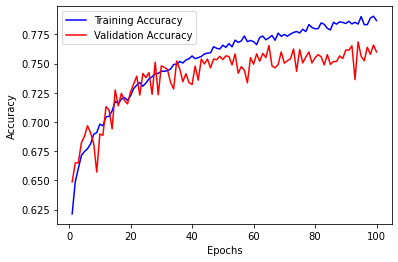

In [27]:
train_acc = training_history.history['accuracy']
val_acc = training_history.history['val_accuracy']

plt.xlabel('Epochs')
plt.ylabel('Accuracy')

plt.plot(np.arange(1,epok +1,1),training_history.history['accuracy'], label='Training Accuracy', color='blue')
plt.plot(np.arange(1,epok +1,1),training_history.history['val_accuracy'], label='Validation Accuracy', color='red')

plt.legend()

plt.show()

- On vérifie sur le X_test en mettant en forme selon le format idoine:

In [28]:
y_pred_1 = model2.predict(X_test)
y_binary_1 = np.round(y_pred_1)

In [29]:
print(classification_report(y_binary_1,y_test))

              precision    recall  f1-score   support

         0.0       0.77      0.66      0.71      2735
         1.0       0.74      0.83      0.79      3219

    accuracy                           0.75      5954
   macro avg       0.76      0.75      0.75      5954
weighted avg       0.76      0.75      0.75      5954



- On procède à la vérification, sur un morceau quelconque:

In [30]:
verif = df.iloc[29,5]

In [31]:
Audio(verif,rate = 11025)

- On met en forme pour pouvoir utiliser notre réseau de neurones:

In [32]:
df_verif = create_data_fast(verif,nb_var)
df_verif['liste'] = df_verif[df_verif.columns[0:nb_var+1]].apply(lambda x: list(x.dropna()),axis = 1)
df_verif['count'] = df_verif['liste'].apply(lambda x : count(x))
df_verif['oscille'] = df_verif['liste'].apply(lambda x : oscille(x))
df_verif['periode'] = df_verif['liste'].apply(lambda x : periode(x))

df_verif_ready = df_verif.drop(['liste'],axis = 1)

- On applique le modèle de deep learning précédemment entraîné:

In [33]:
y_pred = model2.predict(df_verif_ready)

In [34]:
y_binaire = np.round(y_pred,0)

- On met en forme le résultat:
    - On adjoint les prédictions à nos échantillons.
    - On sépare les voix prédites des silences prédits.
    - On produit les audibles et on écoute.

In [35]:
df_filtrat = pd.concat([df_verif,pd.DataFrame(y_binaire,columns =['label'])],axis = 1)
df_filtrat_propre = df_filtrat.drop(['liste','count','oscille','periode'],axis = 1)

df_filtrat_voix = df_filtrat_propre[df_filtrat_propre['label']==1].drop(['label'],axis = 1)
df_filtrat_silence = df_filtrat_propre[df_filtrat_propre['label']==0].drop(['label'],axis = 1)

In [36]:
voix_filtree = df_filtrat_voix.loc[df_filtrat_voix.index[0]]
for i in df_filtrat_voix.index[1:]:
    voix_filtree = np.concatenate([voix_filtree,df_filtrat_voix.loc[i]])
    
mute_filtree = df_filtrat_silence.loc[df_filtrat_silence.index[0]]
for i in df_filtrat_silence.index[1:]:
    mute_filtree = np.concatenate([mute_filtree,df_filtrat_silence.loc[i]])    

In [37]:
Audio(voix_filtree,rate = 11025)

Trop de silences de voix sont perceptibles

In [38]:
Audio(mute_filtree,rate = 11025)

On entend  quelques voix

- On réalise les opérations requises pour être en mesure de présenter le rapport de classification:

In [39]:
seuil_vocal_verif = np.where(abs(verif)> seuil,1,0)
df_seuil_vocal_verif = create_data_fast(seuil_vocal_verif,nb_var)
df_seuil_vocal_verif['somme'] = df_seuil_vocal_verif.sum(axis = 1)
df_seuil_vocal_verif['label'] = df_seuil_vocal_verif['somme'].apply(lambda x : 0 if x ==0 else 1)

In [40]:
print(classification_report(y_binaire,df_seuil_vocal_verif['label']))

              precision    recall  f1-score   support

         0.0       0.75      0.00      0.00      1583
         1.0       0.52      1.00      0.69      1723

    accuracy                           0.52      3306
   macro avg       0.64      0.50      0.34      3306
weighted avg       0.63      0.52      0.36      3306



## Résultats et conclusions

- L'écoute des voix et musiques non chantées prédits est qualitativement moins belle que pour la classification initiale.
- Néanmoins, on saurait distinguer en test aveugle à quelle classe correspond l'écoute de l'une ou l'autre des pistes produites alors que ce n'est pas à priori l'info annoncée par le rapport.
- Cela est dû au fait  que l'erreur de classification ne tient qu'à une seule variable, un seul pas de temps au dessus du seuil, et le résultat qui en découle n'est pas discernable par l'oreille humaine.


Cela confirme la nécessité absolue de ne pas se fier aveuglément aux rapports et de bien exploiter la matière première de notre projet. En définitive, seule l'oreille sera juge de la qualité finale du résultat.